### Notebook for the inference of cell-cell communications on COPD-IAV data using `LIANA+` and Tensor cell2cell

- **Developed by**: Carlos Talavera-López, Christian Eger, and Camila Melo
- **Würzburg Institute for Systems Immunology, Faculty of Medicine, Julius-Maximilian-Universität Würzburg**
- **Created**: 231109
- **Latest version**: 23022024

### Import required modules

In [1]:
import anndata
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import liana as li
import scanpy as sc
import cell2cell as c2c
import decoupler as dc # needed for pathway analysis
from collections import defaultdict
import pickle
import torch
import io
import plotnine as p9
import decoupler as dc # needed for pathway analysis
from statannotations.Annotator import Annotator
from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean

/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
import omnipath as op

### Set up working environment

In [3]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.5.post1
scanpy      1.9.8
-----
PIL                 10.2.0
annotated_types     0.6.0
asttokens           NA
attr                23.2.0
brotli              1.1.0
cell2cell           0.7.3
certifi             2024.02.02
charset_normalizer  3.3.2
comm                0.2.1
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.1
decorator           5.1.1
decoupler           1.6.0
docrep              0.3.2
exceptiongroup      1.2.0
executing           2.0.1
h5py                3.10.0
idna                3.6
inflect             NA
ipykernel           6.29.2
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
kneed               0.8.5
liana               1.0.4
llvmlite            0.42.0
matplotlib          3.8.3
mizani              0.11.0
mpl_toolkits        NA
mudata              0.2.3
natsort             8.4.0
networkx            3.2.1
numba               0.59.0
numpy               1.26.4
omnipath

### Read in all data

In [4]:
adata_all = sc.read_h5ad('/home/camila93/Documents/cellchat/Marburg_cell_states_locked_scANVI_ctl230901.raw.h5ad') 
adata_all



AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', 'seed_labels', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'mt', 'ribo'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Liana per sample

In [5]:
sample_key = 'batch'
condition_key = 'group'
groupby = 'cell_states'

### Logaritmic transformation of data

In [6]:
sc.pp.normalize_total(adata_all, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_all)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['ACTB', 'BPIFA1', 'MALAT1', 'MT-ATP6', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT-CYB', 'MT-ND1', 'MT-ND2', 'MT-ND3', 'MT-ND4', 'MT-ND5', 'MTRNR2L12', 'MTRNR2L8', 'NC_026431.1', 'NC_026432.1', 'NC_026433.1', 'NC_026434.1', 'NC_026435.1', 'NC_026436.1', 'NC_026437.1', 'NC_026438.1', 'SAA1', 'SCGB1A1', 'SCGB3A1', 'SLPI']
    finished (0:00:00)


### Show pre-computed UMAP

/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/sc

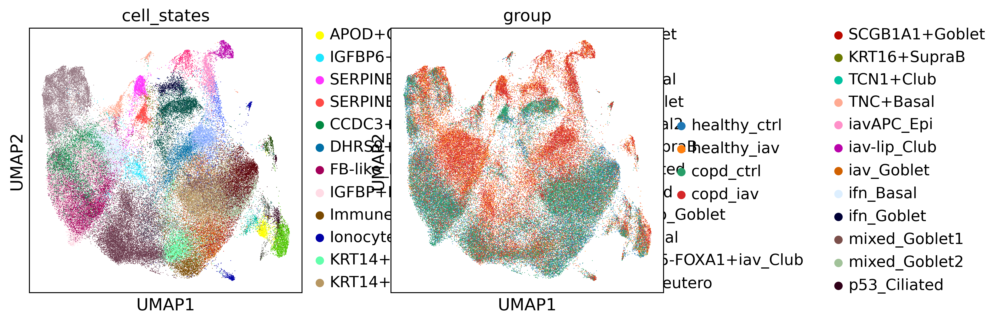

In [7]:
sc.pl.umap(adata_all, color=[groupby, condition_key],frameon=True)

### Run Aggregate

In [8]:
context_dict = adata_all.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)
context_dict

defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'healthy_ctrl',
             'CSE_06_CRTL': 'healthy_ctrl',
             'GER14_CRTL': 'healthy_ctrl',
             'GnR08_CTRL': 'healthy_ctrl',
             'GER12_CTRL': 'healthy_ctrl',
             'GER02_CTRL': 'healthy_ctrl',
             'ST08_GnR_CTRL': 'healthy_iav',
             'CSE_06_IAV': 'healthy_iav',
             'GER14_IAV': 'healthy_iav',
             'GnR08_IAV': 'healthy_iav',
             'GER12_IAV': 'healthy_iav',
             'GER02_IAV': 'healthy_iav',
             'ST09_CSE_IAV': 'copd_ctrl',
             'GnR_07_CTRL': 'copd_ctrl',
             'CHE01_CTRL': 'copd_ctrl',
             'CHE02_CTRL': 'copd_ctrl',
             'CHE03_CTRL': 'copd_ctrl',
             'CSE03_CTRL': 'copd_ctrl',
             'ST10_GnR_IAV': 'copd_iav',
             'GnR_07_IAV': 'copd_iav',
             'CHE01_IAV': 'copd_iav',
             'CHE02_IAV': 'copd_iav',
             'CHE03_IAV': 'copd_iav',
      

In [35]:
li.mt.rank_aggregate.by_sample(
    adata_all,
    groupby=groupby,
    sample_key=sample_key, # sample key by which we which to loop
    use_raw=False,
    seed=1789,
    min_cells=5,
    verbose=True, # use 'full' to show all verbose information
    #n_perms=100, # reduce permutations for speed
    return_all_lrs=True, # return all LR values
    )


Now running: CHE01_CTRL:   0%|          | 0/24 [00:00<?, ?it/s]/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:148: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:151: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/sc/_liana_pipe.py:251: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: Downcasting object dt

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/sc/_liana_pipe.py:251: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: Downcasting object dt

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/sc/_liana_pipe.py:251: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: Downcasting object dt

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/method/sc/_liana_pipe.py:251: ImplicitModificationWarning: Setting element `.layers['scaled']` of view, initializing view as actual.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_reassemble_complexes.py:56: FutureWarning: Downcasting object dt

: 

In [10]:
adata_all.uns['liana_res'].sort_values("magnitude_rank").head(20)

KeyError: 'liana_res'

In [9]:
li.mt.rank_aggregate.describe()

Rank_Aggregate returns `magnitude_rank`, `specificity_rank`. magnitude_rank and specificity_rank respectively represent an aggregate of the `magnitude`- and `specificity`-related scoring functions from the different methods.


### Save the results

In [10]:
adata_all.write_h5ad("./anndata_liana.h5ad")

### Reading results

In [8]:
adata_all = sc.read_h5ad("anndata_liana.h5ad")

### Build Tensor --> This was done by Christian

In [ ]:
#tensor = li.multi.to_tensor_c2c(adata,
                                #sample_key=sample_key,
                                #score_key='magnitude_rank', # can be any score from liana
                                #how='outer_cells' # how to join the samples
                                #)

### Saving tensor on disk with pickle

In [ ]:
#c2c.io.export_variable_with_pickle(tensor, "./liana_tensor.pkl")

## Run Tensor cell2cell in whole dataset now!!!!

In [12]:
class CPU_Unpickler(pickle.Unpickler):
    def find_class(self, module, name):
        if module == 'torch.storage' and name == '_load_from_bytes':
            return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
        else: return super().find_class(module, name)


In [13]:
with open("./liana_tensor_2.pkl", "rb") as f:
    tensor = CPU_Unpickler(f).load()

In [14]:
sample_key = 'batch'
condition_key = 'group'
groupby = 'cell_states'

In [15]:
tensor.tensor.shape

torch.Size([24, 2435, 36, 36])

### Building Metadata

In [16]:
context_dict = adata_all.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)

tensor_meta = c2c.tensor.generate_tensor_metadata(interaction_tensor=tensor,
                                                  metadata_dicts=[context_dict, None, None, None],
                                                  fill_with_order_elements=True
                                                  )


In [17]:
context_dict


defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'healthy_ctrl',
             'CSE_06_CRTL': 'healthy_ctrl',
             'GER14_CRTL': 'healthy_ctrl',
             'GnR08_CTRL': 'healthy_ctrl',
             'GER12_CTRL': 'healthy_ctrl',
             'GER02_CTRL': 'healthy_ctrl',
             'ST08_GnR_CTRL': 'healthy_iav',
             'CSE_06_IAV': 'healthy_iav',
             'GER14_IAV': 'healthy_iav',
             'GnR08_IAV': 'healthy_iav',
             'GER12_IAV': 'healthy_iav',
             'GER02_IAV': 'healthy_iav',
             'ST09_CSE_IAV': 'copd_ctrl',
             'GnR_07_CTRL': 'copd_ctrl',
             'CHE01_CTRL': 'copd_ctrl',
             'CHE02_CTRL': 'copd_ctrl',
             'CHE03_CTRL': 'copd_ctrl',
             'CSE03_CTRL': 'copd_ctrl',
             'ST10_GnR_IAV': 'copd_iav',
             'GnR_07_IAV': 'copd_iav',
             'CHE01_IAV': 'copd_iav',
             'CHE02_IAV': 'copd_iav',
             'CHE03_IAV': 'copd_iav',
      

### Running Tensor-cell2cell

Running Tensor Factorization


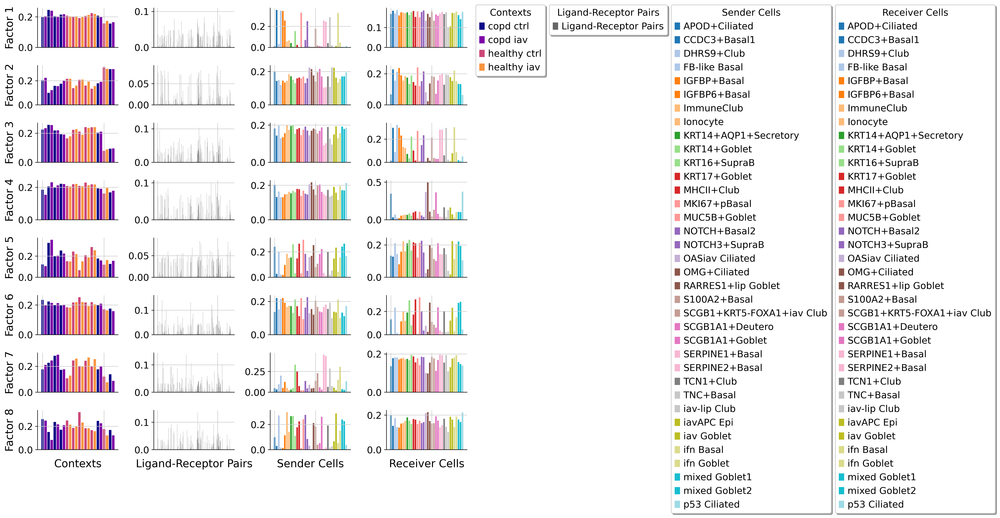

In [18]:
tensor = c2c.analysis.run_tensor_cell2cell_pipeline(tensor,
                                                    tensor_meta,
                                                    copy_tensor=True, # Whether to output a new tensor or modifying the original
                                                    rank=8, # Number of factors to perform the factorization. If None, it is automatically determined by an elbow analysis. Here, it was precomuputed.
                                                    tf_optimization='regular', # To define how robust we want the analysis to be.
                                                    random_state=888, # Random seed for reproducibility
                                                    device='cpu', # Device to use. If using GPU and PyTorch, use 'cuda'. For CPU use 'cpu'
                                                    elbow_metric='error', # Metric to use in the elbow analysis.
                                                    smooth_elbow=False, # Whether smoothing the metric of the elbow analysis.
                                                    upper_rank=25, # Max number of factors to try in the elbow analysis
                                                    tf_init='random', # Initialization method of the tensor factorization
                                                    tf_svd='numpy_svd', # Type of SVD to use if the initialization is 'svd'
                                                    cmaps=None, # Color palettes to use in color each of the dimensions. Must be a list of palettes.
                                                    sample_col='Element', # Columns containing the elements in the tensor metadata
                                                    group_col='Category', # Columns containing the major groups in the tensor metadata
                                                    fig_fontsize=14,
                                                    output_fig=True, # Whether to output the figures. If False, figures won't be saved a files if a folder was passed in output_folder.
                                                    )

### Enrichment analysis

In [19]:
# load PROGENy pathways
net = dc.get_progeny(organism='human', top=5000)

In [20]:

# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')

In [21]:
factors = tensor.factors

In [22]:
factors.keys()

odict_keys(['Contexts', 'Ligand-Receptor Pairs', 'Sender Cells', 'Receiver Cells'])

In [23]:
factors['Contexts']

,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Factor 8
CHE01_CTRL,0.200811,0.205224,0.225656,0.185749,0.121616,0.234046,0.177120,0.261706
CHE01_IAV,0.204781,0.223968,0.234390,0.154607,0.105104,0.197795,0.210980,0.249068
CHE02_CTRL,0.246305,0.100082,0.257875,0.205789,0.325494,0.223315,0.227978,0.151880
CHE02_IAV,0.240682,0.122099,0.255779,0.231066,0.355267,0.214532,0.245162,0.083627
CHE03_CTRL,0.204759,0.157161,0.219014,0.200033,0.198286,0.199619,0.280959,0.237572
CHE03_IAV,0.203049,0.155520,0.219925,0.212275,0.205114,0.212261,0.289375,0.217094
CSE03_CTRL,0.215669,0.175474,0.192872,0.222048,0.253146,0.197289,0.172346,0.171164
CSE03_IAV,0.217835,0.203262,0.191832,0.220048,0.224117,0.203111,0.176414,0.209749
CSE_06_CRTL,0.208375,0.216080,0.164953,0.208790,0.152246,0.184314,0.107528,0.249686
CSE_06_IAV,0.204201,0.216923,0.178806,0.205587,0.149506,0.182950,0.127956,0.215127


In [24]:
# Generate color by severity for each sample
condition_colors = c2c.plotting.aesthetics.get_colors_from_labels(['healthy_ctrl', 'copd_ctrl', 'healthy_iav', 'copd_iav'], cmap='plasma')

# Map these colors to each sample name
color_dict = {k : condition_colors[v] for k, v in context_dict.items()}

col_colors = pd.Series(color_dict)
col_colors = col_colors.to_frame()
col_colors.columns = ['disease status']

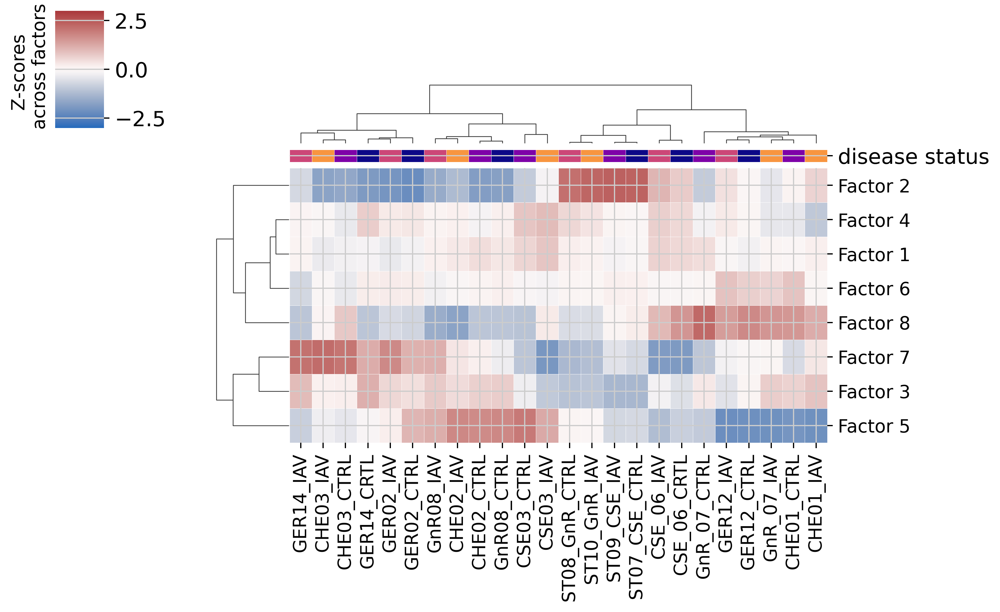

In [25]:
c2c.plotting.loading_clustermap(factors['Contexts'],
                                use_zscore=True, # Whether standardizing the loadings across factors
                                col_colors=col_colors, # Change this to color by other properties
                                figsize=(9, 6),
                                dendrogram_ratio=0.3,
                                cbar_fontsize=12,
                                tick_fontsize=12
                                )

/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/cell2cell/plotting/factor_plot.py:146: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



AttributeError: module 'seaborn.categorical' has no attribute '_BoxPlotter'

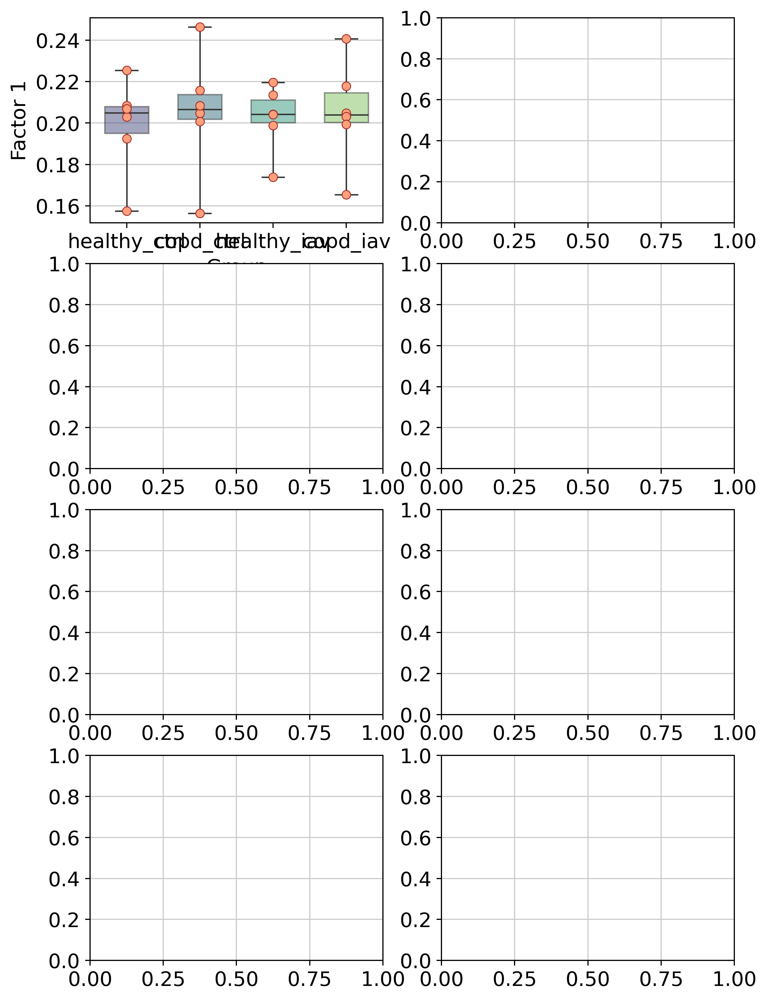

In [26]:
c2c.plotting.factor_plot.context_boxplot(factors['Contexts'],
                            metadict=context_dict,
                            group_label_rotation= 45,
                            nrows=4,
                            figsize=(8, 12),
                            group_order=['healthy_ctrl', 'copd_ctrl', 'healthy_iav', 'copd_iav'],
                            statistical_test='t-test_ind',
                            pval_correction='fdr_bh',
                            verbose=False,
                            cmap='viridis',
                            ylabel="Context Loadings"
                            )

(<Figure size 2880x4320 with 6 Axes>,
 array([[<Axes: title={'center': 'Factor 1'}>,
         <Axes: title={'center': 'Factor 2'}>],
        [<Axes: title={'center': 'Factor 3'}>,
         <Axes: title={'center': 'Factor 4'}>],
        [<Axes: title={'center': 'Factor 5'}>,
         <Axes: title={'center': 'Factor 6'}>]], dtype=object))

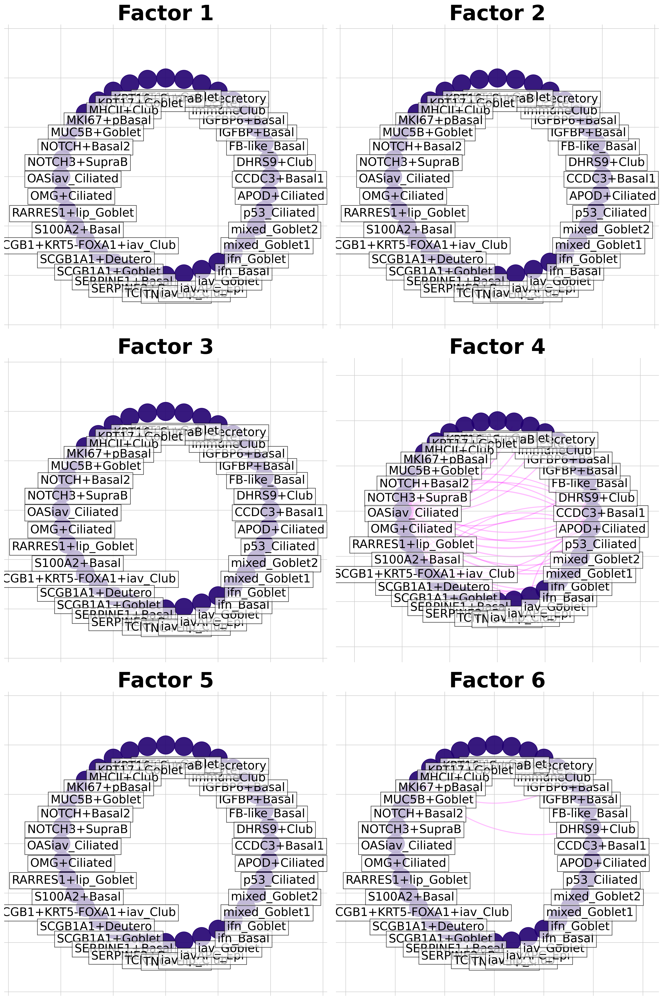

In [27]:
c2c.plotting.ccc_networks_plot(factors,
                               included_factors=['Factor 1','Factor 2', 'Factor 3','Factor 4','Factor 5','Factor 6'],
                               network_layout='circular',
                               ccc_threshold=0.07, # Only important communication
                               nrows=3,
                               panel_size=(8, 8), # This changes the size of each figure panel.
                              )

### Enrichment analysis

In [28]:
lr_loadings = factors['Ligand-Receptor Pairs']

In [29]:
# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('consensus')

In [30]:
# generate ligand-receptor geneset
lr_progeny = li.rs.generate_lr_geneset(lr_pairs, net, lr_sep="^")
lr_progeny.head()

/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:105: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/home/camila93/miniforge3/envs/liana_cuda-env/lib/python3.10/site-packages/liana/resource/_resource_utils.py:112: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to a

,source,interaction,weight
60,JAK-STAT,LGALS9^PTPRC,1.307807
844,JAK-STAT,LGALS9^CD47,2.054778
1130,Trail,LGALS9^PTPRK,0.937003
1432,JAK-STAT,LGALS9^HAVCR2,1.487678
1779,EGFR,DLL1^NOTCH1,-1.000584


In [31]:
# run enrichment analysis
estimate, pvals = dc.run_ulm(lr_loadings.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

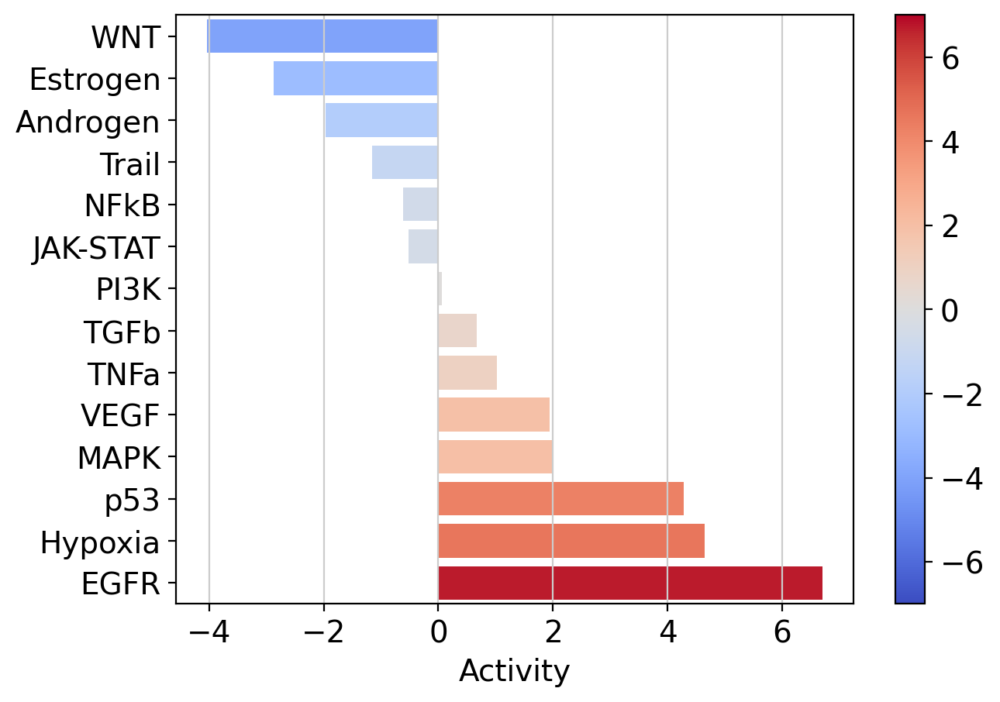

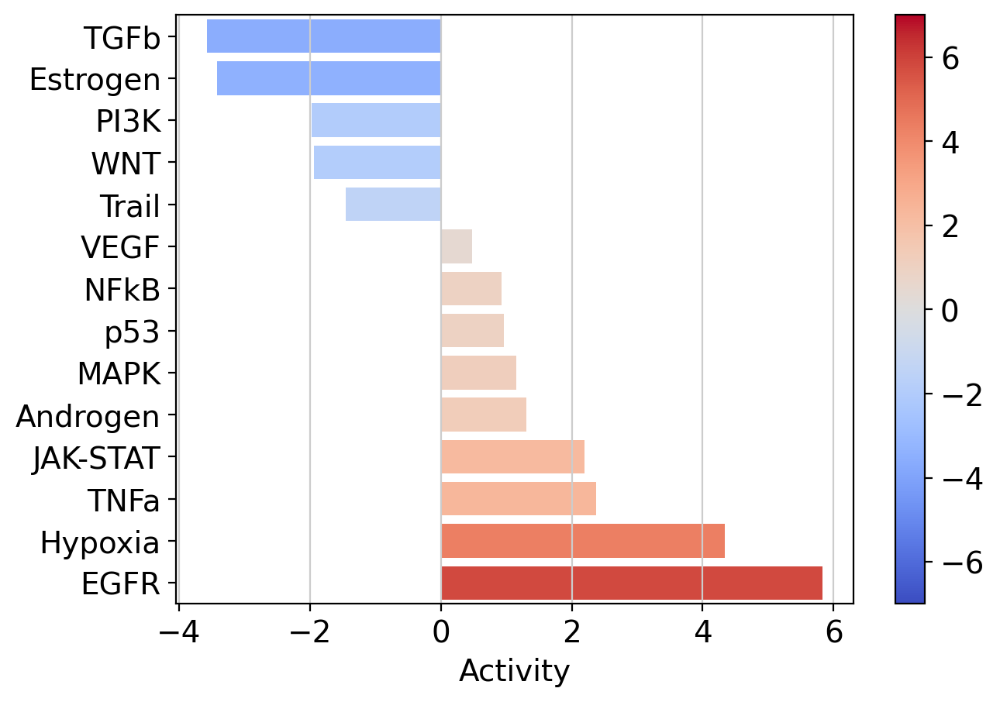

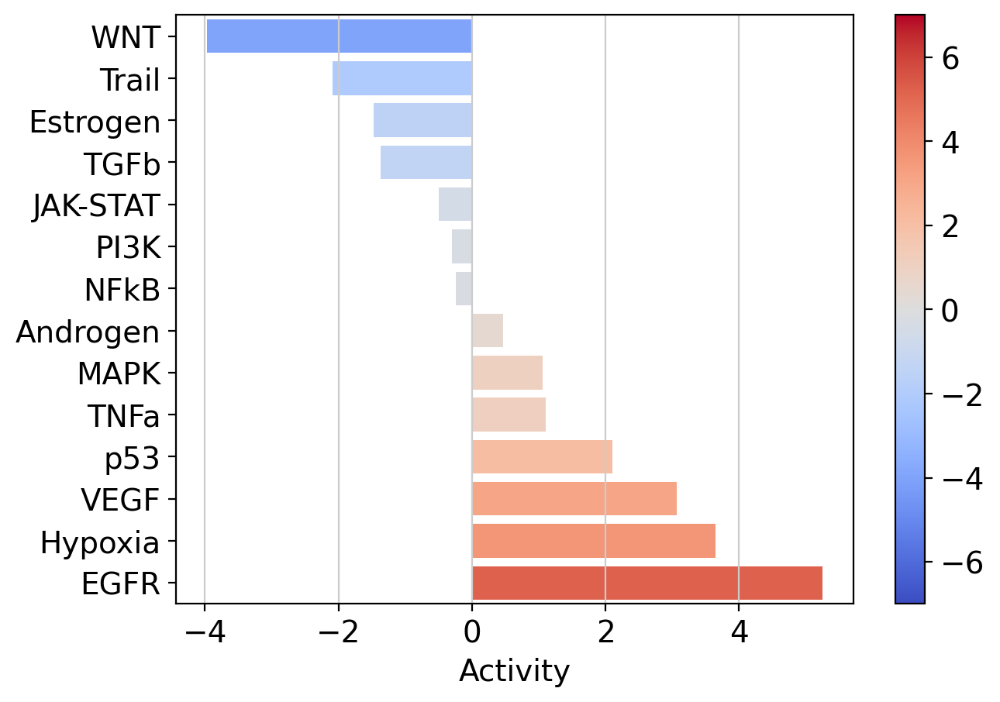

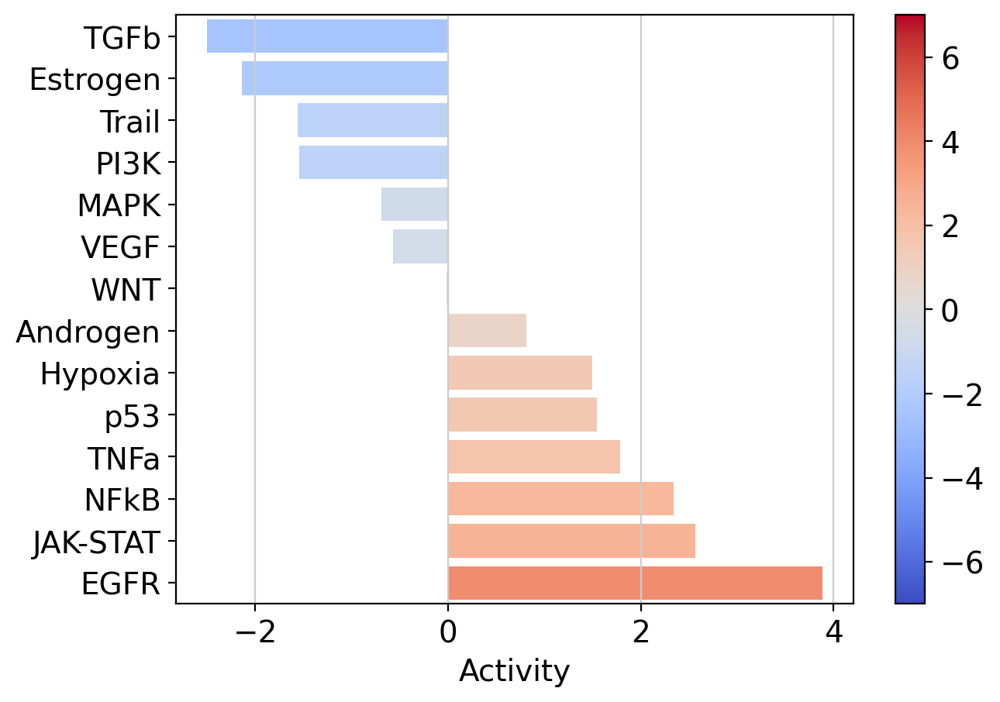

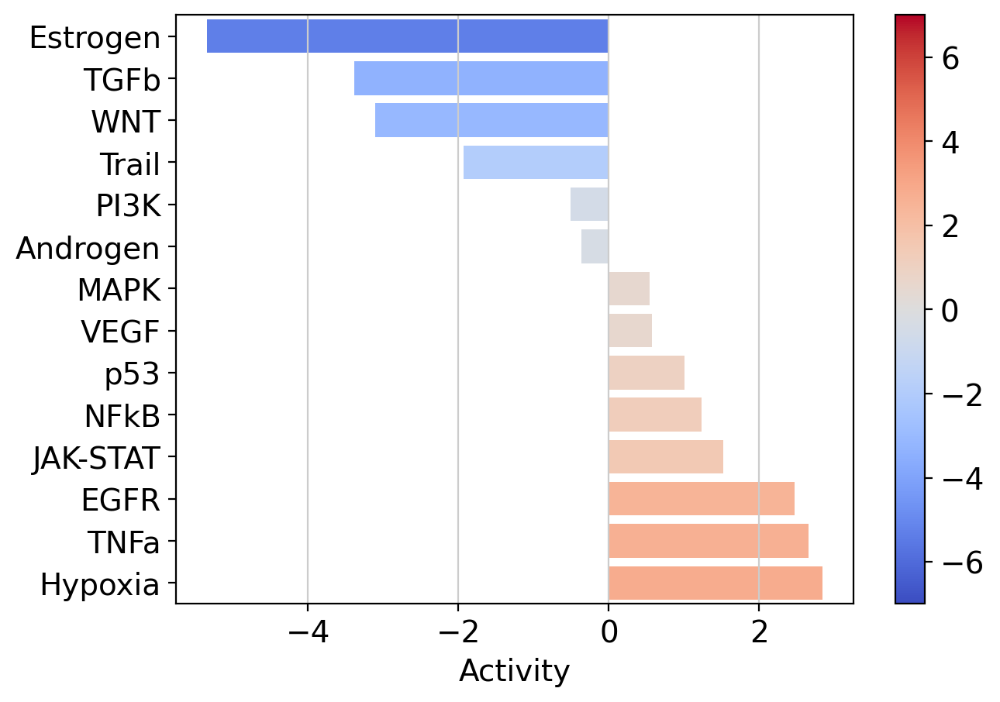

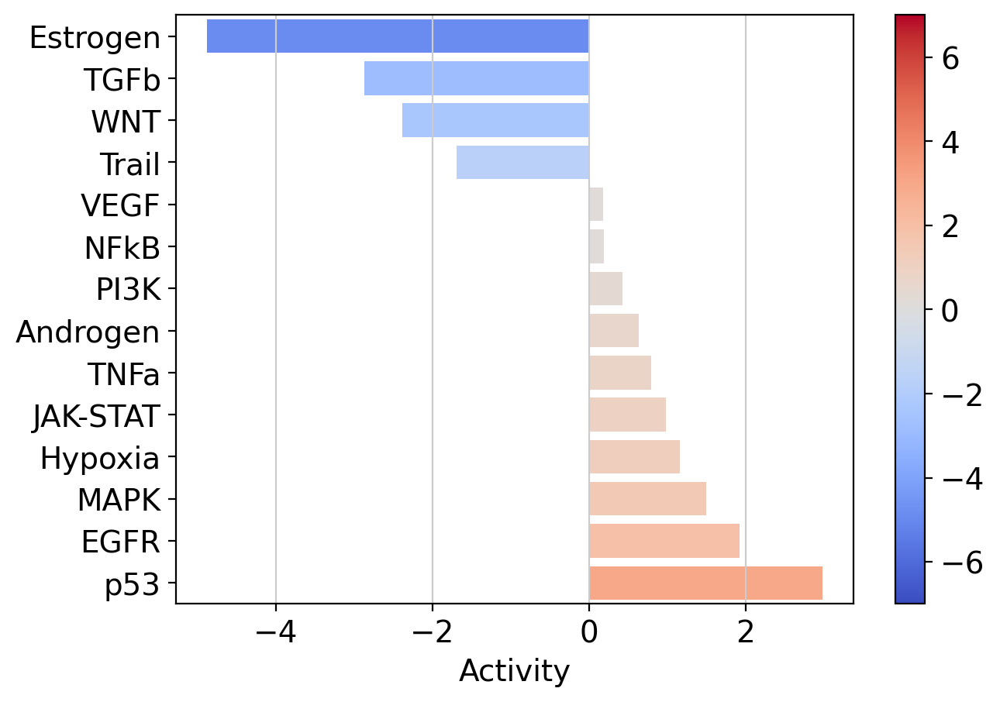

In [34]:
dc.plot_barplot(estimate, 'Factor 1', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate, 'Factor 2', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate, 'Factor 3', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate, 'Factor 4', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate, 'Factor 5', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)
dc.plot_barplot(estimate, 'Factor 6', vertical=True, cmap='coolwarm', vmin=-7, vmax=7)